# Week 05. Decision Tree

과제는 총 3개의 cell과 markdown 하나를 채워주셔야합니다

1~3 문제는 영상과 실습자료에 나와있는 것들을 적절히 응용하시면 됩니다

마지막 4번의 경우 본인의 생각을 마크다운으로 작성하는 부분입니다

주석의 경우 이미지, 테이블 등의 표현이 어려운 관계로 받지 않겠습니다

### 실습 00. Load dataset

이번 과제에 사용할 dataset은 실습 설명에 사용한 wine dataset입니다

ML dataset repository인 UCI에서 받을 수 있습니다

이외에도 다양한 dataset이 있으니 ML에 관심이 있으신 분들은 아래 사이트를 참고해주세요

UCI repository : https://archive.ics.uci.edu/ml/index.php

모두가 같은 결과를 확인하기 위해 dataset을 train set과 validation set으로 분리해두었습니다

자료실에서 x_train,x_test,y_train,y_test 파일을 받은 후 불러와주세요

In [1]:
import pandas as pd
import numpy as np
import os 

from sklearn.datasets import load_iris

x_train=pd.read_csv('x_train.csv')
x_test=pd.read_csv('x_test.csv')
y_train=pd.read_csv('y_train.csv')
y_test=pd.read_csv('y_test.csv')

In [2]:
x_train.shape, y_train.shape

((4547, 11), (4547, 1))

In [3]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,6.4,0.460,0.22,14.7,0.047,51.0,183.0,0.998275,3.39,0.60,10.5
1,6.3,0.340,0.36,4.9,0.035,31.0,185.0,0.994600,3.15,0.49,9.7
2,8.1,0.725,0.22,2.2,0.072,11.0,41.0,0.996700,3.36,0.55,9.1
3,8.6,0.490,0.28,1.9,0.110,20.0,136.0,0.997200,2.93,1.95,9.9
4,6.0,0.140,0.37,1.2,0.032,63.0,148.0,0.991850,3.32,0.44,11.2
...,...,...,...,...,...,...,...,...,...,...,...
4542,9.9,0.350,0.38,1.5,0.058,31.0,47.0,0.996760,3.26,0.82,10.6
4543,8.9,0.610,0.49,2.0,0.270,23.0,110.0,0.997200,3.12,1.02,9.3
4544,7.9,0.160,0.30,4.8,0.037,37.0,171.0,0.996700,3.47,0.44,9.0
4545,6.8,0.300,0.33,12.8,0.041,60.0,168.0,0.996590,3.10,0.56,9.8


In [4]:
y_train.head()

,quality
0,0
1,0
2,0
3,1
4,0


In [5]:
y_test.values

array([[1],
       [0],
       [0],
       ...,
       [1],
       [0],
       [0]], dtype=int64)

### 실습 01. Decision Tree - criterion

불러온 data를 학습하기 위해 scikit-learn의 decision tree class를 불러옵니다

서로 다른 criterion을 사용하여 full tree를 생성하고 graphviz로 시각화해주세요

In [6]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
import graphviz


def gini(mat):
    probs=1
    for n in range(2):
        probs-=(mat==n).mean()**2
    return probs

def entropy(mat):
    probs=0
    for n in range(2):
        probs+=(mat==n).mean()*np.log2((mat==n).mean()+1e-15)
    return -probs

mat=np.zeros((101,100))

for n in range(101):
    mat[n,:n]=1

score=[]
for m in mat:
    score.append([gini(m), entropy(m)])

score=np.array(score)

In [7]:
gini_model=DecisionTreeClassifier(criterion='gini').fit(x_train, y_train)
gini_model.score(x_test, y_test)

0.6153846153846154

In [8]:
entropy_model=DecisionTreeClassifier(criterion='entropy').fit(x_train, y_train)
entropy_model.score(x_test, y_test)

0.6282051282051282

In [9]:
feature_names = x_train.columns

In [10]:
class_names = np.array(['class_0', 'class_1', 'class_2'])

In [11]:
feature_names

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

In [12]:
graph_data=export_graphviz(gini_model,
                           feature_names = x_train.columns,
                           class_names   = class_names,
                           filled=True, rounded=True, special_characters=True)
graph=graphviz.Source(graph_data)
graph

In [14]:
graph_data=export_graphviz(entropy_model,
                           feature_names = x_train.columns,
                           class_names   = class_names,
                           filled=True, rounded=True, special_characters=True)
graph=graphviz.Source(graph_data, filename='entropy.png', format='png')
graph

### 실습 02. Decision Tree - pre pruning

pre pruning을 위한 hyperparameter를 사용해보겠습니다

실습에서 설명드린 다양한 hyper parameter를 사용하여 pruning해보세요

그리고 그 결과를 graphviz로 나타내고, full tree와 complexity, evaluation score를 비교해주세요

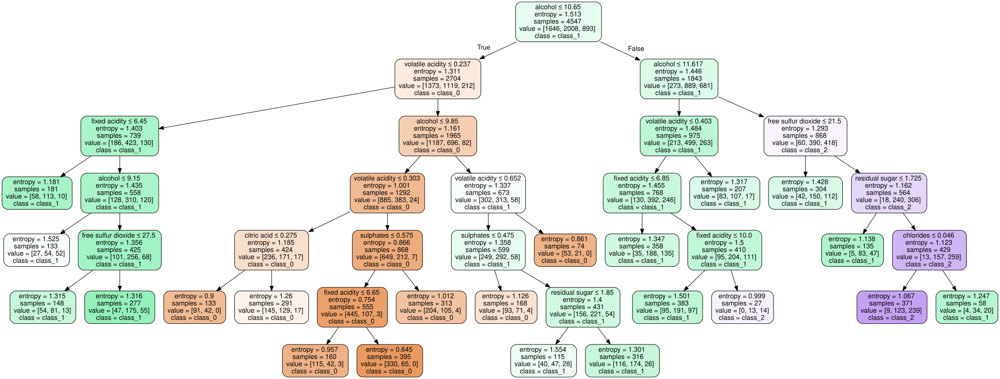

In [15]:
from plotly import graph_objs as go

tree=DecisionTreeClassifier(criterion='entropy',
                            min_samples_split=400).fit(x_train, y_train)
graph_data=export_graphviz(tree,
                           feature_names = x_train.columns,
                           class_names   = class_names,
                           filled=True, rounded=True, special_characters=True)
graph=graphviz.Source(graph_data)
graph

### 실습 03. Decision Tree - post pruning

tree의 ccp path class를 사용하여 post pruning을 시도해보세요

실습영상과 같이 시각화 해보고, 적절한 ccp alpha를 제시해주세요

In [16]:
tree=DecisionTreeClassifier(criterion='entropy').fit(x_train, y_train)

fig=go.Figure()
fig.add_trace(go.Scatter(x=tree.cost_complexity_pruning_path(x_train, y_train)['ccp_alphas'],
                         y=tree.cost_complexity_pruning_path(x_train, y_train)['impurities'],
                         name = 'Train'))
fig.add_trace(go.Scatter(x=tree.cost_complexity_pruning_path(x_test, y_test)['ccp_alphas'],
                         y=tree.cost_complexity_pruning_path(x_test, y_test)['impurities'],
                         name = 'Test'))
fig_options={'layout':dict(template='simple_white',
                           width=800, height=500,
                           xaxis_title='A parameter for post pruning',
                           yaxis_title='The impurities - entropy')}
fig.update(fig_options)
fig.show()

In [17]:
ccp=tree.cost_complexity_pruning_path(x_train, y_train)
ccp_alphas=ccp.ccp_alphas

clfs= []
for ccp_alpha in ccp_alphas:
    clf= DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(x_train, y_train)
    clfs.append(clf)
    
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]

train_scores = [clf.score(x_train, y_train) for clf in clfs]
test_scores = [clf.score(x_test, y_test) for clf in clfs]

In [18]:
from plotly.subplots import make_subplots

fig = make_subplots(
    rows=2, cols=2,
    specs=[[{},{}],
        [{"colspan":2, "secondary_y":True}, None]],
    subplot_titles=("Node vs ccp", "Depth vs ccp", "Acc of train and test"),
    row_heights=[0.3,0.7],
)
fig.add_trace(go.Scatter(x=ccp_alphas, y=node_counts, showlegend=False),
              row=1, col=1)

fig.add_trace(go.Scatter(x=ccp_alphas, y=depth, showlegend=False),
              row=1, col=2)
fig.add_trace(go.Scatter(x=ccp_alphas, y=train_scores, name="Train"),
              secondary_y=False,
              row=2, col=1)
fig.add_trace(go.Scatter(x=ccp_alphas, y=test_scores, name="Test"),
              secondary_y=True,
              row=2, col=1)

fig_options={'layout':dict(template='simple_white', width=800, height=600,
                          ),
            }
fig.update_xaxes(title_text="ccp alphas")
fig.update_yaxes(title_text="Acc for training set", secondary_y=False, row=2, col=1)
fig.update_yaxes(title_text="Acc for test set", secondary_y=True, row=2, col=1)

fig.update(fig_options)
fig.show()

ccp를 증가시킴에 따라 node수와 depth는 줄어들지만 test set이 overfit되었다.

### 실습 04. Scaling

지난 시간 k-Nearest Neighbors classification을 실습하였습니다

실습 과정을 통해, scaling 여부에 따라 kNN의 성능이 변화하는 것을 확인하였습니다

Decision tree에서는 scaling 여부에 따라 모델의 성능 차이가 존재하는지 학생분들의 의견을 자유롭게 작성해주세요

knn에선 데이터의 크기 분포가 이상적이지 않을떄 상대적으로 잡아줬었다.
Decision tree실습과 과정을 하는과정에서는 변수의 정규화나 표준화를 했던 기억이
없던걸로 보아 scaling 여부의따라 모델의 성능차이가 크게 존재하지 않는것같다.
찾아보니 데이터의 스케일에 구애받지 않고 이진특성, 
연속특성이 혼합되어 있을때도 작 작동한다고 한다.

의견은 글로써 반드시 남겨주셔야합니다 

그림만으로 설명할 경우 배점이 없습니다